# 5.Exploratory Data Analysis (EDA)

### Word-cloud | Remove Stop-words 
At this point I make sure, the words have the correct sensitive polarity and I clean the stop words so that the most used words can be seen.

In [1]:
import pandas as pd
import re
import ssl

In [2]:
data_filtered = pd.read_csv('data_labeled_emosent.csv')

In [3]:
data_filtered.shape

(9770, 19)

In [4]:
# # remove stop-words
stopwords_list = pd.read_csv('stopwords.csv', encoding='ISO-8859-1')['words'].tolist()
data_filtered['clean_words'] = data_filtered['clean_msg'].apply(lambda x: ' '.join([word for word in str(x).split() if word.lower() not in stopwords_list]))

### Word-cloud | Remove remaining Stop-words manually
Some words not included in the stop-words file are still in the list of positive words. I remove them to leave only nouns, adjectives and other words that really represent the positive meaning of the messages.

In [5]:
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(o)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(ayer)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(mucha)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(muchas)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(mucho)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(ahi)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(esos)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(otro)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(hoy)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(nada)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(nada)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(está)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(estás)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(ahora)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(esto)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(tanto)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(cumpleee)+\b', 'cumple', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(cómo)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(ver)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(x)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(dice)+\b', '', regex=True)
data_filtered['clean_msg'] = data_filtered['clean_msg'].str.replace(r'\b(creo)+\b', '', regex=True)

In [6]:
import wordcloud
import PIL
from PIL import Image
import wordcloud
from wordcloud import WordCloud
import plotly
import plotly.graph_objs as go
import matplotlib.pyplot as plt
%matplotlib inline

In [7]:
def show_wordcloud(data, title = None):
    wordcloud = WordCloud(
        background_color = 'white',
        max_words = 200,
        max_font_size = 40, 
        scale = 3,
        random_state = 42
    ).generate(str(data))
    #).generate(data)

    fig = plt.figure(1, figsize = (20, 20))
    plt.axis('off')
    if title: 
        fig.suptitle(title, fontsize = 20)
        fig.subplots_adjust(top = 2.3)

    plt.imshow(wordcloud)
    plt.show()

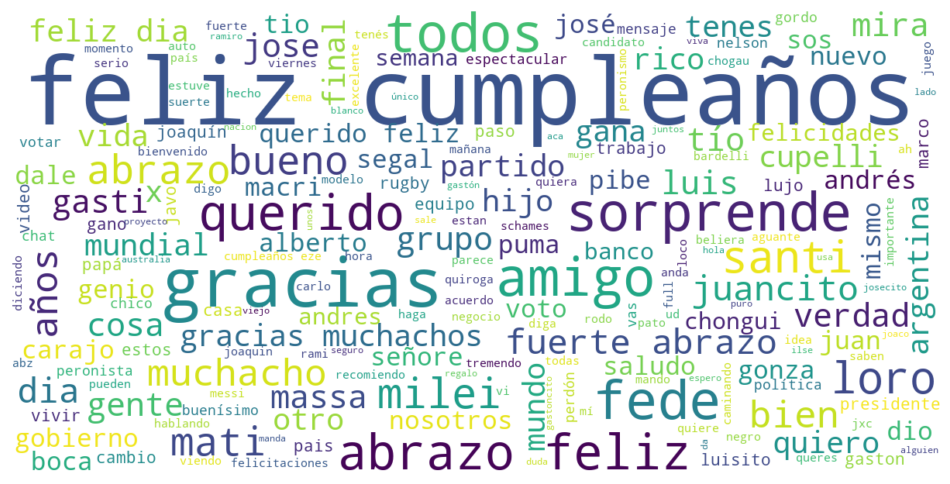

In [8]:
# Define the function to show the word cloud
def show_wordcloud(data, title=None):
    wc = WordCloud(
        background_color='white',
        max_words=200,
        max_font_size=40,
        scale=3,
        random_state=1
    ).generate(data)

    plt.figure(figsize=(12, 12))
    plt.imshow(wc, interpolation="bilinear")
    plt.axis('off')
    if title:
        plt.title(title, size=24)
    plt.show()

# Assuming 'data_filtered' is your DataFrame
Positive = data_filtered[data_filtered["Sentiment_Label"] == 'Positive']

# Concatenate the messages
concatenated_message = ' '.join(Positive['clean_words'].tolist()).strip()

# Show the word cloud
show_wordcloud(concatenated_message)


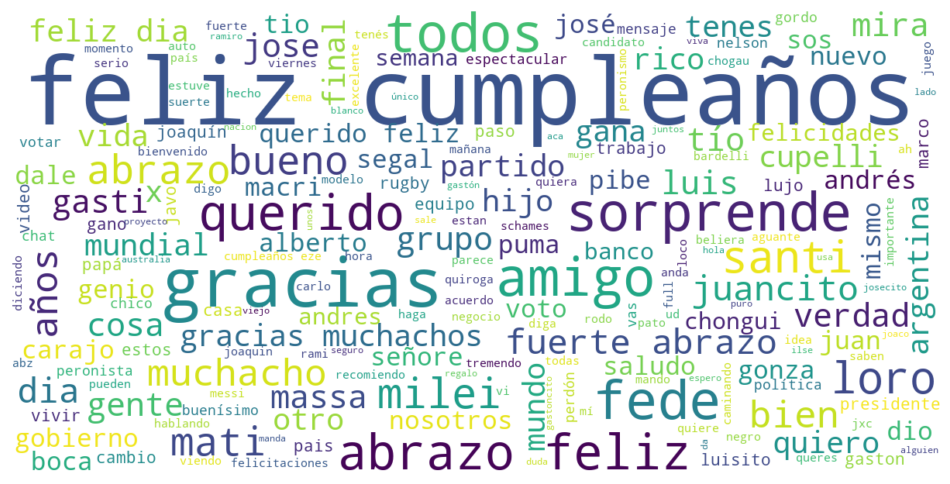

In [9]:
Positive = data_filtered[data_filtered["Sentiment_Label"] == 'Positive']
concatenated_message = ''
for i in range(Positive.shape[0]):
    concatenated_message += ' ' + Positive['clean_words'].iloc[i]

# to remove leading space
concatenated_message = concatenated_message.strip()
show_wordcloud(concatenated_message)

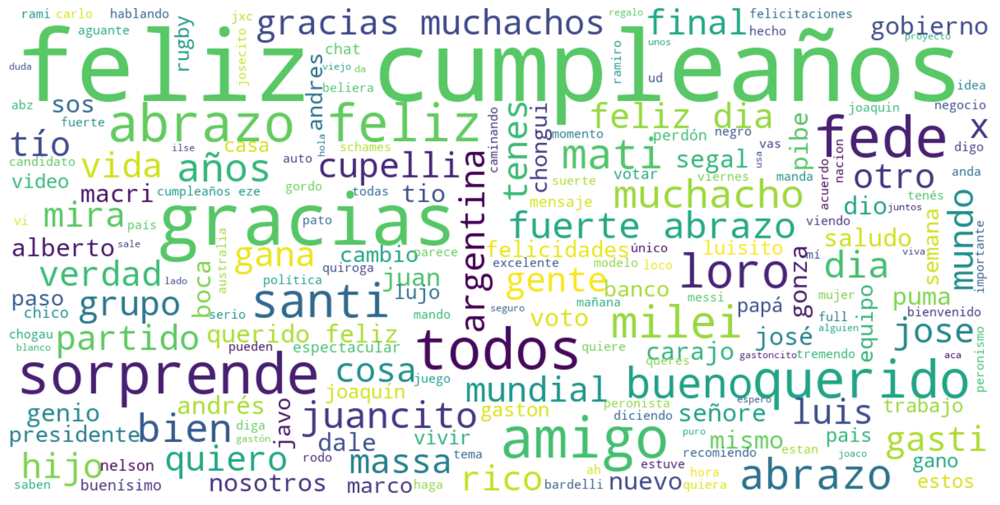

In [10]:
from matplotlib import pyplot as plt
from wordcloud import WordCloud

def show_wordcloud(data, title=None):
    wordcloud = WordCloud(
        background_color='white',
        max_words=200,
        max_font_size=40,
        scale=3,
        random_state=42
    ).generate(str(data))

    plt.figure(figsize=(20, 20))
    plt.imshow(wordcloud, interpolation="bilinear")
    plt.axis('off')
    
    if title:
        plt.suptitle(title, fontsize=20)
        plt.subplots_adjust(top=2.3)

    plt.show()

# Use the function with your concatenated_message
show_wordcloud(concatenated_message)

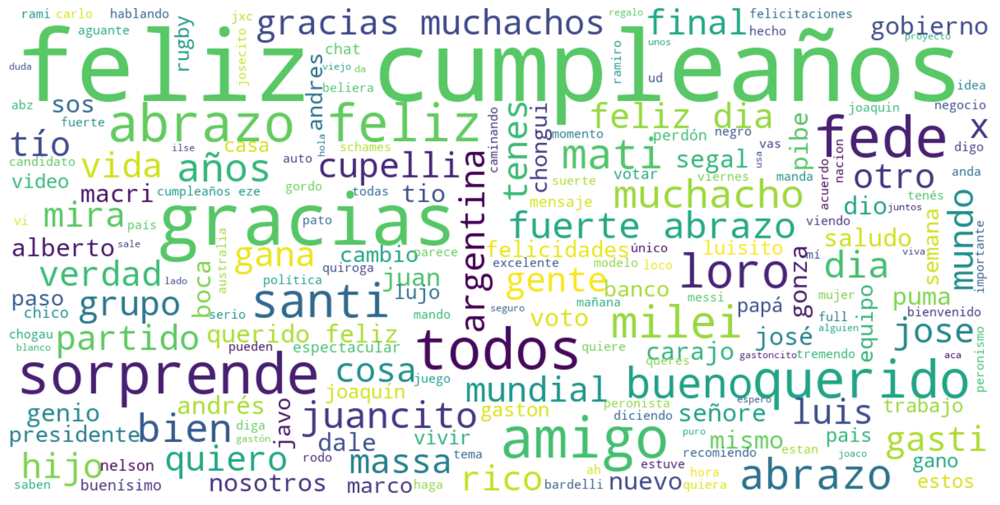

In [11]:
Positive = data_filtered[data_filtered["Sentiment_Label"] == 'Positive']
concatenated_message = ''
for i in range(Positive.shape[0]):
    concatenated_message += ' ' + Positive['clean_words'].iloc[i]

# to remove leading space
concatenated_message = concatenated_message.strip()
show_wordcloud(concatenated_message)

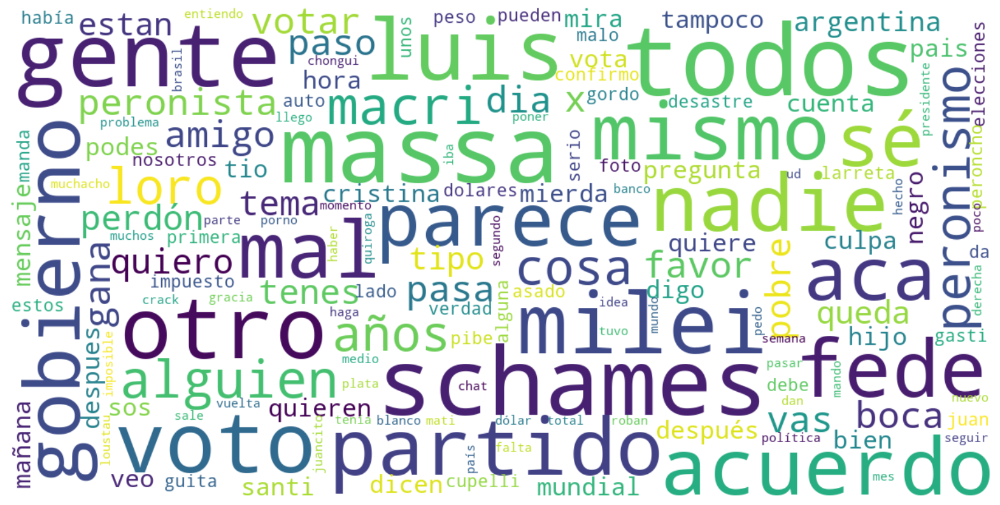

In [12]:
Negative = data_filtered[data_filtered["Sentiment_Label"] == 'Negative']
Negative_concatenated = ''
for i in range(Negative.shape[0]):
    Negative_concatenated += ' ' + Negative['clean_words'].iloc[i]

# to remove leading space
Negative_concatenated = Negative_concatenated.strip()
show_wordcloud(Negative_concatenated)

## Conversation stats

In [13]:
selected_columns = ['rDate', 'Month', 'Year', 'Weekday', 'Time', 'Time-Day', 'Morning',
       'Afternoon', 'Night', 'Sender', 'clean_msg', 'emoji','word_count_group',
       'Sentiment_Label', 'Emosent_Label', 'is_msg', 'is_emoji','clean_words']

chat = data_filtered[selected_columns]

# Assuming 'Time' is the current name of the column and data_filtered is your DataFrame
chat = chat.rename(columns={'rDate': 'date'})
chat = chat.rename(columns={'Time': 'hour'})
chat = chat.rename(columns={'Sentiment_Label': 'sentiment'})
chat = chat.rename(columns={'Sender': 'username'})
chat = chat.rename(columns={'clean_msg': 'message'})
chat = chat.rename(columns={'Emosent_Label': 'emosent'})
chat = chat.rename(columns={'word_count_group': 'msg_categ'})

chat.columns

Index(['date', 'Month', 'Year', 'Weekday', 'hour', 'Time-Day', 'Morning',
       'Afternoon', 'Night', 'username', 'message', 'emoji', 'msg_categ',
       'sentiment', 'emosent', 'is_msg', 'is_emoji', 'clean_words'],
      dtype='object')

## Use of emojis
The results showed that 😂 Face with Tears of Joy was the most commonly used emoji, followed by 👍 Thumbs Up, 🙏 Folded Hands, and 🥰 Smiling Face with Hearts. According to Emojipedia, these emojis suggest positive emotions, which could be assumed that the chat messages with emojis tended to be more positive in tone.

Next, I analyzed the word count of the messages sent by each member to understand their communication styles.

In [14]:
chat.groupby('username').agg({'message': 'count',
                              'emoji': lambda x: ' '.join(set(emoji for emojis in x.dropna() for emoji in emojis))
                              }).sort_values(by='message', ascending=False)

,message,emoji
username,,
Chongui,1767,➕ ️ 🤐 ☝ 🥰 🏼 🫡 💪 😳 _ 😂 🤑 🤷 🤯 🙋 🤔 😃 ❓ 😘 🤪 🤦 👇 ⚠ 😁 😍
Fede,1698,️ 🥱 🤬 🥳 🤣 ☝ 🤜 😱 🐣 💪 🪄 ✌ 👎 🙄 😜 _ 😴 😂 🤷 🩷 ❤ 😛 🤔 ...
Juan,1286,️ 😱 🏼 🏻 🤕 👂 🐨 ✌ 🙄 _ 😂 🤔 🐑 🦘 ⚠ 🔥 😎 💨 🧐 👏 🪃 🐶 😉 😟
Barde,814,🥳 👯 🤔 🚨 🤭 🦍 _ 🤦 🏻 😉 🤌 🎂
Loro,617,💩 🤬 😣 😡 😆 💪 ✈ ✌ 🙄 🫢 😜 🍺 🥃 🤷 🧉 😛 😑 😌 👌 🤪 🥵 🔚 👍 ...
Belle,494,💩 ️ 🤣 🎊 💼 🦆 🦜 🎂 🎤 🎁 👎 🎉 _ 😂 👨 🌞 👌 🚢 ⚠ 👏 😭 💤 👍 🥇 ☕
Delca,435,⚠ ️ 👏 🙌 _ 😂 🙁
Yames,373,☝ 💨 ✌ 🙄 _ 👆
Eze,341,⚠ ️ 😎 💙 🏉 👏 🙄 _ 🤪 😂 🤦 🙏 🌱


In [15]:
from collections import Counter
import pandas as pd

emoji_counter = Counter()

# Iterate over each message in the 'emoji' column
for message in chat['emoji']:
    # Check if the message is not NaN and is a string
    if not pd.isna(message) and isinstance(message, str):
        # Exclude "_" emoji and update the counter
        emoji_counter.update(emoji for emoji in message if emoji != "_")

# Create a DataFrame from the Counter
emoji_df = pd.DataFrame(emoji_counter.most_common(), columns=['emoji', 'count'], index=range(1, len(emoji_counter) + 1))

chat['emoji'] = chat['emoji'].replace({'🏻':'🤷'})
chat['emoji'] = chat['emoji'].replace({'⚠':'⚠️'})

# Display the top 20 emojis
emoji_df.head(15)

,emoji,count
1,😂,503
2,🤣,277
3,🏻,221
4,😅,169
5,👏,149
6,🤷,89
7,🤦,80
8,💪,65
9,🐔,54
10,🤔,50


In [16]:
chat['is_emoji_empty'] = chat['emoji'].apply(lambda x: 0 if pd.isna(x) or x == '_' else 1)
grouped_chat = chat.groupby('is_emoji_empty').size().reset_index(name='count')

chat['is_emoji'] = chat['emoji'].apply(lambda x: True if x != '_' else False)
grouped_chat = chat.groupby('is_emoji').size().reset_index(name='count')

In [17]:
import plotly.graph_objects as go

# Create a pie chart using Plotly
fig = go.Figure(data=go.Pie(
    labels=['Chats without emoji', 'Chats with emoji'],
    values=grouped_chat['count'],
    hole=0.4,marker=dict(colors=['#25D366', '#075E54']),
    title=dict(text='<b>Overall</b>', font=dict(size=16))))

fig.update_traces(hoverinfo='label+value')

In [18]:
fig = go.Figure(data=go.Pie(labels=['Negative', 'Neutral', 'Positive'],
                            values=chat.groupby('sentiment').count()[['message']].reset_index()['message'],
                             hole=.4, marker=dict(colors=['#075E54', '#dcf8c6', '#25D366']),
                             title=dict(text='<b>Overall</b>', font=dict(size=16))))

fig.update_traces(hoverinfo='label+value')

In [19]:
from plotly.subplots import make_subplots

fig = make_subplots(rows=1, cols=2, specs=[[{'type':'domain'}, {'type':'domain'}]])

fig.add_trace(go.Pie(labels=['Negative', 'Neutral', 'Positive'],
                     values=chat[chat.is_emoji_empty == 0].groupby('sentiment').count()[['message']].reset_index()['message'],
                     marker=dict(colors=['#075E54','#dcf8c6', '#25D366', ]),
                     title=dict(text='<b>without Emoji</b>', font=dict(size=16))), 1, 1)

fig.add_trace(go.Pie(labels=['Negative', 'Neutral', 'Positive'],
                     values=chat[chat.is_emoji_empty == 1].groupby('sentiment').count()[['message']].reset_index()['message'],
                     hole=.4, marker=dict(colors=['#075E54','#dcf8c6', '#25D366', ]),
                     title=dict(text='<b>with Emoji</b>', font=dict(size=16))), 1, 2)

fig.update_traces(hole=.4, hoverinfo='label+value')

## Messages per member
Next, I analyzed the word count of the messages sent by each member to understand their communication styles.

In [20]:
from whatstk import WhatsAppChat, FigureBuilder

fig = FigureBuilder(chat.assign(message=chat['message'].apply(lambda x: ''.join([' ' for i in range(len(x.split())) if x != '<Media omitted>'])))
                    ).user_msg_length_boxplot(title=None, xlabel=None)

In [21]:
fig

## Message activity
Looking at the conversation stats, it was pretty obvious that some members were more active than others. But, to really get what was going on in this group chat, I needed to see how often messages were being sent over time. Thus, I delved deeper to get the scoop on message activity.

## Activity by day

In [22]:
chat['date'] = pd.to_datetime(chat['date'])
# chat.info()

In [23]:
fig = FigureBuilder(chat).user_interventions_count_linechart(title=None, xlabel=None, all_users=True)
fig

## Interventions

In [24]:
chat.columns

Index(['date', 'Month', 'Year', 'Weekday', 'hour', 'Time-Day', 'Morning',
       'Afternoon', 'Night', 'username', 'message', 'emoji', 'msg_categ',
       'sentiment', 'emosent', 'is_msg', 'is_emoji', 'clean_words',
       'is_emoji_empty'],
      dtype='object')

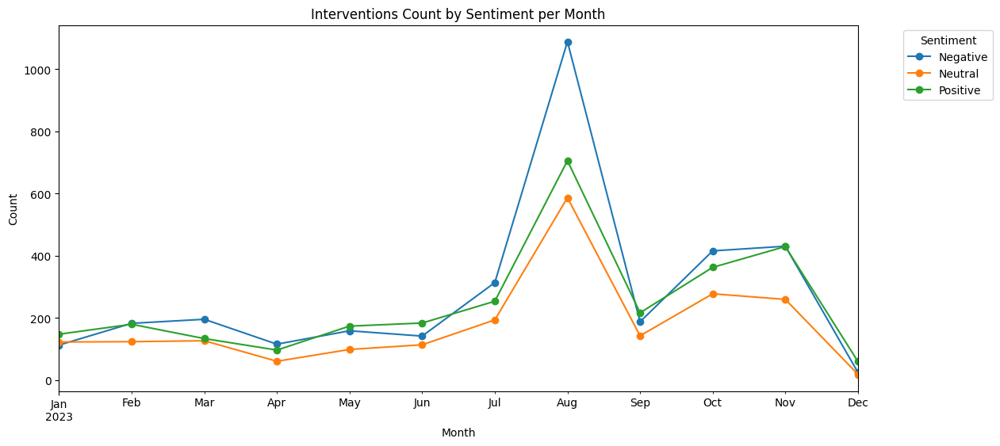

In [25]:
import pandas as pd
import matplotlib.pyplot as plt

# Assuming 'date' and 'sentiment' are the relevant columns in your DataFrame (chat)
# Replace them with the actual column names in your DataFrame
chat['date'] = pd.to_datetime(chat['date'])  # Convert 'date' column to datetime if not already
chat['month'] = chat['date'].dt.to_period('M')  # Extract month

# Group by both 'month' and 'sentiment', count interventions, and unstack the result
grouped_data = chat.groupby(['month', 'sentiment']).size().unstack(fill_value=0)

# Plotting the line chart
fig, ax = plt.subplots(figsize=(13, 6))
grouped_data.plot(kind='line', ax=ax, marker='o')

# Customize the plot
ax.set_title("Interventions Count by Sentiment per Month")
ax.set_xlabel("Month")
ax.set_ylabel("Count")
plt.legend(title='Sentiment', bbox_to_anchor=(1.05, 1), loc='upper left')
plt.show()


In [26]:
chat.columns

Index(['date', 'Month', 'Year', 'Weekday', 'hour', 'Time-Day', 'Morning',
       'Afternoon', 'Night', 'username', 'message', 'emoji', 'msg_categ',
       'sentiment', 'emosent', 'is_msg', 'is_emoji', 'clean_words',
       'is_emoji_empty', 'month'],
      dtype='object')

In [27]:
chat.head()

,date,Month,Year,Weekday,hour,Time-Day,Morning,Afternoon,Night,username,message,emoji,msg_categ,sentiment,emosent,is_msg,is_emoji,clean_words,is_emoji_empty,month
0,2023-01-01,1,2023,Sunday,00:03:00,Night,0,0,1,Jose,feliz año europa,🍾🍾🍾🍾🍾🍾🍾🍾🍾🍾,short msg,Positive,Neutral,msg,True,feliz europa,1,2023-01
1,2023-01-01,1,2023,Sunday,00:04:00,Night,0,0,1,Quiroga,feliz año gente,❣,short msg,Positive,Positive,msg,True,feliz gente,1,2023-01
2,2023-01-01,1,2023,Sunday,00:04:00,Night,0,0,1,Jose,el resto del mundo que esperen,🥱🥱🤣🤣🤣,short msg,Positive,Neutral,msg,True,resto mundo esperen,1,2023-01
3,2023-01-01,1,2023,Sunday,00:04:00,Night,0,0,1,Jose,feliz año ramiro carajo,_,short msg,Positive,Neutral,msg,False,feliz ramiro carajo,0,2023-01
4,2023-01-01,1,2023,Sunday,00:04:00,Night,0,0,1,Jose,_,🍾🍾🍾🍾🍾,short msg,Neutral,Neutral,msg,True,_,1,2023-01


In [28]:
fig = FigureBuilder(chat).user_interventions_count_linechart(cumulative=True, title=None, xlabel=None)
fig

In [29]:
fig = FigureBuilder(chat).user_interventions_count_linechart(date_mode='date', title=None, xlabel=None)
fig

## Activity by hour 

In [30]:
chat.columns

Index(['date', 'Month', 'Year', 'Weekday', 'hour', 'Time-Day', 'Morning',
       'Afternoon', 'Night', 'username', 'message', 'emoji', 'msg_categ',
       'sentiment', 'emosent', 'is_msg', 'is_emoji', 'clean_words',
       'is_emoji_empty', 'month'],
      dtype='object')

In [31]:
chat.dtypes

date              datetime64[ns]
Month                      int64
Year                       int64
Weekday                   object
hour                      object
Time-Day                  object
Morning                    int64
Afternoon                  int64
Night                      int64
username                  object
message                   object
emoji                     object
msg_categ                 object
sentiment                 object
emosent                   object
is_msg                    object
is_emoji                    bool
clean_words               object
is_emoji_empty             int64
month                  period[M]
dtype: object

In [32]:
chat['hour'] = pd.to_datetime(chat['hour']).dt.hour

In [33]:
# chat['hour'] = pd.to_datetime(chat['hour']).dt.hour.astype(int)

In [34]:
chat.tail(5)

,date,Month,Year,Weekday,hour,Time-Day,Morning,Afternoon,Night,username,message,emoji,msg_categ,sentiment,emosent,is_msg,is_emoji,clean_words,is_emoji_empty,month
9765,2023-12-11,12,2023,Monday,12,Morning,1,0,0,Belle,buenos días amigos mil gracias mi gente beia,_,regular msg,Positive,Neutral,msg,False,buenos amigos mil gracias gente beia,0,2023-12
9766,2023-12-11,12,2023,Monday,12,Morning,1,0,0,Aguja,feliz cumpleaños gasti querido,_,short msg,Positive,Neutral,msg,False,feliz cumpleaños gasti querido,0,2023-12
9767,2023-12-11,12,2023,Monday,12,Morning,1,0,0,Marcos,feliz cumpleaños gastoncito abrazo grande,🎉,short msg,Positive,Positive,msg,True,feliz cumpleaños gastoncito abrazo,1,2023-12
9768,2023-12-11,12,2023,Monday,12,Morning,1,0,0,Rodo,muy feliz cumpleaños gastón abrazo,_,short msg,Positive,Neutral,msg,False,feliz cumpleaños gastón abrazo,0,2023-12
9769,2023-12-11,12,2023,Monday,13,Afternoon,0,1,0,Gasti_Boy,feliz cumpleaños tocayo un gran abrazo,_,short msg,Positive,Neutral,msg,False,feliz cumpleaños tocayo abrazo,0,2023-12


In [35]:
pivot = pd.pivot_table(chat, index='hour', columns='Weekday', values='message', aggfunc='count').fillna(0)
heatmap = go.Heatmap(z=pivot.values,
                     x=pivot.columns,
                     y=pivot.index,
                     hovertemplate='Interventions at %{y}-hour<extra>%{z}</extra>',
                     colorscale='Greens')
fig = go.Figure(data=[heatmap]).update_layout(xaxis={'categoryorder': 'array',
                                                     'categoryarray': ['Monday', 'Tuesday', 'Wednesday',
                                                                       'Thursday', 'Friday', 'Saturday', 'Sunday']})
fig

In [36]:
chat.columns

Index(['date', 'Month', 'Year', 'Weekday', 'hour', 'Time-Day', 'Morning',
       'Afternoon', 'Night', 'username', 'message', 'emoji', 'msg_categ',
       'sentiment', 'emosent', 'is_msg', 'is_emoji', 'clean_words',
       'is_emoji_empty', 'month'],
      dtype='object')

In [37]:
pivot = pd.pivot_table(chat, index='Time-Day', columns='Weekday', values='message', aggfunc='count').fillna(0)
heatmap = go.Heatmap(z=pivot.values,
                     x=pivot.columns,
                     y=pivot.index,
                     hovertemplate='Interventions at %{y}-Time-Day<extra>%{z}</extra>',
                     colorscale='Greens')
fig = go.Figure(data=[heatmap]).update_layout(xaxis={'categoryorder': 'array',
                                                     'categoryarray': ['Monday', 'Tuesday', 'Wednesday',
                                                                       'Thursday', 'Friday', 'Saturday', 'Sunday']})
fig

In [38]:
chat['date'] = pd.to_datetime(chat['date'])

In [39]:
hour_chat = chat.groupby('hour').size().reset_index(name='count')
hour_chat.head()

,hour,count
0,0,510
1,1,441
2,2,303
3,3,438
4,4,192


In [40]:
fig = FigureBuilder(chat).user_interventions_count_linechart(date_mode='weekday',
                                                             title=None,
                                                             xlabel=None).update_layout(xaxis={'tickvals': [0, 1, 2, 3, 4, 5, 6],
                                                                                               'ticktext': ['Monday', 'Tuesday', 'Wednesday',
                                                                                                            'Thursday', 'Friday', 'Saturday', 'Sunday']})
fig

## Member interaction

In [41]:
fig = FigureBuilder(chat).user_message_responses_heatmap(title=None)
fig

In [42]:
fig = FigureBuilder(chat).user_message_responses_flow(title=None)
fig

## How everyone’s feeling

In [43]:
# + and - by user
pivot = pd.pivot_table(chat, index='sentiment',
                       columns='username',
                       values='message',
                       aggfunc='count').apply(lambda x: x/x.sum(), axis=0)
heatmap = go.Heatmap(z=pivot.values,
                     x=pivot.columns,
                     y=pivot.index,
                     hovertemplate='Interventions<extra>%{z:.2%}</extra>',
                     colorscale='Greens')
fig = go.Figure(data=[heatmap])
fig

## Conclusion
After analyzing our WhatsApp group chat, it can be concluded that our group chat was a 
fun and supportive space where everyone showed appreciation for one another and had a good laugh. 
Despite a mostly neutral sentiment, the use of emojis added a positive touch. The chat’s topics vary greatly, from casual banter to serious discussions, making for an engaging and diverse conversation.
Overall, the analysis provided valuable insights into what our group chat is all about.

In [44]:
data_filtered.columns

Index(['rDate', 'Month', 'Year', 'Weekday', 'Time', 'Time-Day', 'Morning',
       'Afternoon', 'Night', 'Sender', 'clean_msg', 'emoji',
       'word_count_group', 'Sentiment_Polarity', 'Sentiment_Label',
       'Emosent_Polarity', 'Emosent_Label', 'is_msg', 'is_emoji',
       'clean_words'],
      dtype='object')

## 5.Topic modeling

In [45]:
# pip install --upgrade sentence-transformers

In [46]:
# pip install --upgrade --user torch torchvision

In [47]:
chat = data_filtered
chat.columns

Index(['rDate', 'Month', 'Year', 'Weekday', 'Time', 'Time-Day', 'Morning',
       'Afternoon', 'Night', 'Sender', 'clean_msg', 'emoji',
       'word_count_group', 'Sentiment_Polarity', 'Sentiment_Label',
       'Emosent_Polarity', 'Emosent_Label', 'is_msg', 'is_emoji',
       'clean_words'],
      dtype='object')

In [48]:
from bertopic import BERTopic
from sklearn.datasets import fetch_20newsgroups
import re
from umap import UMAP

print(chat.columns)

model = BERTopic(umap_model=UMAP(n_neighbors=15,
                                 n_components=5,
                                 min_dist=0.0,
                                 metric='cosine',
                                 random_state=13),
                language='multilingual',
                 calculate_probabilities=True,
                 nr_topics='auto')

topics, probabilities = model.fit_transform(list(chat[chat.clean_msg != ''].assign(
    message=chat.clean_msg.str.replace(re.compile(r'http\S+'), ''))['clean_msg'].values))

Index(['rDate', 'Month', 'Year', 'Weekday', 'Time', 'Time-Day', 'Morning',
       'Afternoon', 'Night', 'Sender', 'clean_msg', 'emoji',
       'word_count_group', 'Sentiment_Polarity', 'Sentiment_Label',
       'Emosent_Polarity', 'Emosent_Label', 'is_msg', 'is_emoji',
       'clean_words'],
      dtype='object')


In [49]:
model.get_topic_info().head()

,Topic,Count,Name,Representation,Representative_Docs
0,-1,3649,-1_no_que_de_la,"[no, que, de, la, el, lo, se, es, en, un]","[no mas que eso, es un , igual ya hace muchos ..."
1,0,4714,0_feliz_cumpleaños_me_que,"[feliz, cumpleaños, me, que, de, el, no, estoy...","[feliz cumpleaños loro, muy feliz cumpleaños q..."
2,1,452,1_que_voto_votar_los,"[que, voto, votar, los, gobierno, la, de, en, ...",[no dije eso lo que dije fue que si llega a ga...
3,2,137,2_argentina_brasil_en_es,"[argentina, brasil, en, es, de, argentinos, la...",[la mayoría de los países europeos están más e...
4,3,43,3_francia_europa_madrid_franceses,"[francia, europa, madrid, franceses, barcelona...","[un pedacito de francia de ultramar, igual que..."


In [50]:
from bertopic import BERTopic
from umap import UMAP
import re

# Print column names to verify
print(chat.columns)

# Define and initialize the BERTopic model
model = BERTopic(
    umap_model=UMAP(n_neighbors=15, n_components=5, min_dist=0.0, metric='cosine', random_state=13),
    language='multilingual',
    calculate_probabilities=True,
    nr_topics='auto'
)

# Process the messages and dates
clean_messages = chat[chat.clean_msg != ''].assign(
    clean_msg=chat.clean_msg.str.replace(r'http\S+', '')
)['clean_msg'].values

# Fit the model with clean messages
topics, probabilities = model.fit_transform(list(clean_messages))

# Extract dates after fitting the model
dates = chat[chat.clean_msg != '']['rDate'].values

# Fit the model and get topics over time
topics_over_time = model.topics_over_time(list(clean_messages), list(dates), nr_bins=20)
fig = model.visualize_topics_over_time(topics_over_time, title='')
fig.show()

Index(['rDate', 'Month', 'Year', 'Weekday', 'Time', 'Time-Day', 'Morning',
       'Afternoon', 'Night', 'Sender', 'clean_msg', 'emoji',
       'word_count_group', 'Sentiment_Polarity', 'Sentiment_Label',
       'Emosent_Polarity', 'Emosent_Label', 'is_msg', 'is_emoji',
       'clean_words'],
      dtype='object')
